# Лабораторна робота №4
## виконав 
## Жорник Данило 
## студент групи КН-223с


#  Завдання 1. Робота з набором файлів
Створити функцію, що в якості аргумента приймає адресу папки на диску
та повертає датафрейм з наступною інформацією про зображення, що 
знаходяться в папці:
- ім’я файлу;
- кольорову модель;
- формат;
- кількість каналів у зображенні;
- розмір файлу у мегабайтах байтах, округлених до двох знаків після 
коми;
- ширину картинки;
- висоту картинки;
- повний шлях до файлу;
- зменшене зображення.

,Filename,Color Model,Format,Channels,File Size (MB),Width,Height,Full Path,Thumbnail
0,Ant_Man.jpg,RGB,JPEG,3,0.28,632,960,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Ant_Man.jpg,
1,Black_Widow.jpg,RGB,PNG,3,3.01,1200,1639,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Black_Widow.jpg,
2,Captain_America.jpg,RGB,JPEG,3,0.10,275,358,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Captain_America.jpg,
3,Captain_Marvel.jpg,RGB,PNG,3,0.90,670,867,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Captain_Marvel.jpg,
4,Doctor_Strange.jpg,RGB,PNG,3,1.04,768,930,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Doctor_Strange.jpg,
5,Drax.jpg,RGB,PNG,3,2.15,2136,1080,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Drax.jpg,
6,Falcon.jpg,RGB,JPEG,3,0.01,209,339,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Falcon.jpg,
7,Gamora.jpg,RGB,JPEG,3,0.04,258,387,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Gamora.jpg,
8,Hulk.jpg,RGB,JPEG,3,0.07,720,720,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Hulk.jpg,
9,Scarlet_Witch.jpg,RGB,PNG,3,0.73,800,1067,C:\Users\comme\Desktop\школедж\Универ лабы\Python\Code\Lab4_src\Scarlet_Witch.jpg,

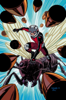
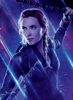
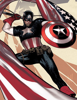
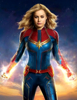
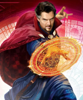
...
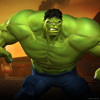
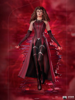
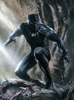
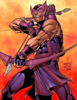
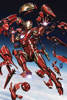

In [28]:
import os
import glob
import base64
from PIL import Image
import pandas as pd
from io import BytesIO
from IPython.display import display
from IPython.core.display import HTML

# Функція для отримання інформації про зображення
def get_image_info(folder_path):
    # Маска для пошуку зображень у зазначеній папці
    image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tiff', '*.gif']
    images = []
    
    for ext in image_extensions:
        images.extend(glob.glob(os.path.join(folder_path, ext)))
    
    image_data = []
    
    for image_path in images:
        try:
            # Відкриття зображення
            with Image.open(image_path) as img:
                # Інформація про зображення
                filename = os.path.basename(image_path)
                format = img.format
                color_model = img.mode
                channels = len(img.getbands())
                file_size = os.path.getsize(image_path) / (1024 * 1024)  # розмір у мегабайтах
                width, height = img.size
                full_path = os.path.abspath(image_path)
                
                # Створення зменшеного зображення для відображення в датафреймі
                img.thumbnail((100, 100))  # зменшене зображення
                img_byte_array = BytesIO()
                img.save(img_byte_array, format='PNG')
                img_base64 = base64.b64encode(img_byte_array.getvalue()).decode('utf-8')
                img_html = f'<img src="data:image/png;base64,{img_base64}" />'

                # Додаємо дані до списку
                image_data.append({
                    'Filename': filename,
                    'Color Model': color_model,
                    'Format': format,
                    'Channels': channels,
                    'File Size (MB)': round(file_size, 2),
                    'Width': width,
                    'Height': height,
                    'Full Path': full_path,
                    'Thumbnail': img_html  # зменшене зображення у форматі base64
                })
        except Exception as e:
            print(f"Could not process file {image_path}: {e}")
    
    # Створення датафрейму
    df = pd.DataFrame(image_data)
    return df

# Приклад використання функції
folder_path = './Lab4_src'  # замініть на адресу вашої папки
df_images = get_image_info(folder_path)

# Виведення результату з відображенням зображень
display(HTML(df_images.to_html(escape=False)))


# Завдання 2. 
Створити функцію, що в якості аргумента приймає:
- шлях до папки;
- назва вихідного зображення;
- кількість зображень в рядку;
- кількість зображень в стовпчику
і повертає зображення постера
Зауваження:
1) Створити функцію, що перетворює картинку на квадрат з максимально 
можливим розміром сторони (наприклад, якщо картинка розміром 800x533, 
то вихідний розмір повинен бути 533x533). Обрізаємо картинку з двох країв, 
тобто розмір розраховуємо від центру.
2) Всі картинки, з яких створено постер, повинні бути однакового розміру, 
Тобто після обрізки необхідно змінити розмір, наприклад, на 500x500.
3) Картинки для додавання в постер обирати випадковим чином. Картинки 
можуть повторюватись.
4) На картинку «накласти фільтр» червоного, зеленого, синього, жовтого, 
пурпурного або голубого кольорів, що також обираються випадковим чином 
та можуть повторюватись.
5) Надати 3-4 варіанти постерів, що збережено у файлах на диску.
6) Використовувати зображення, що знаходяться в папці, що сформована в 
завданні 1
7) Для обробки зображень використовувати бібліотеки Pillow та/або OpenCV.


Poster saved as poster_variant_2x3.jpg


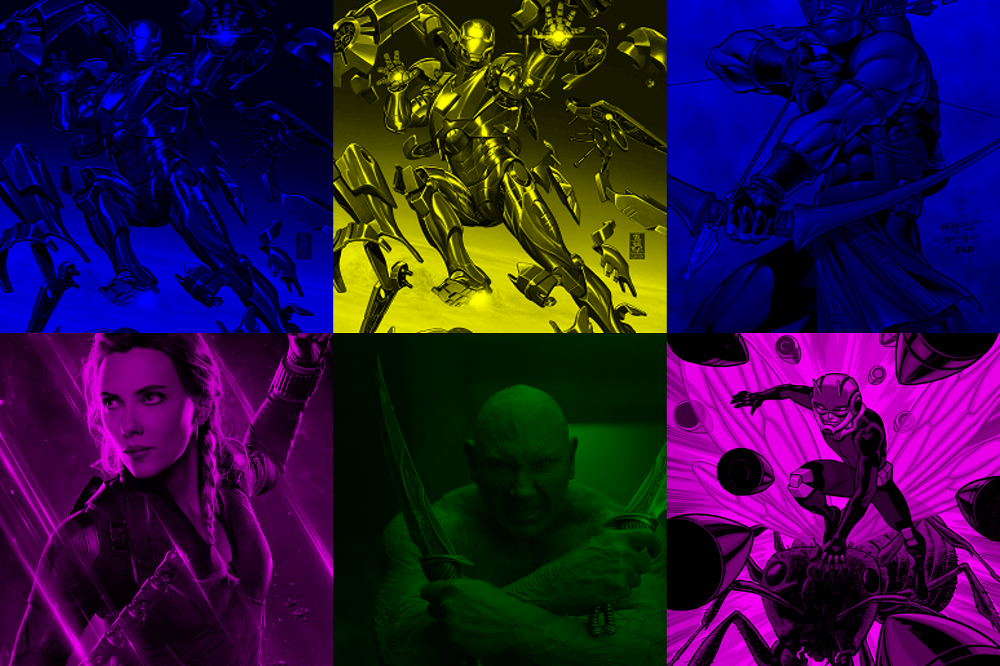

Poster saved as poster_variant_3x4.png


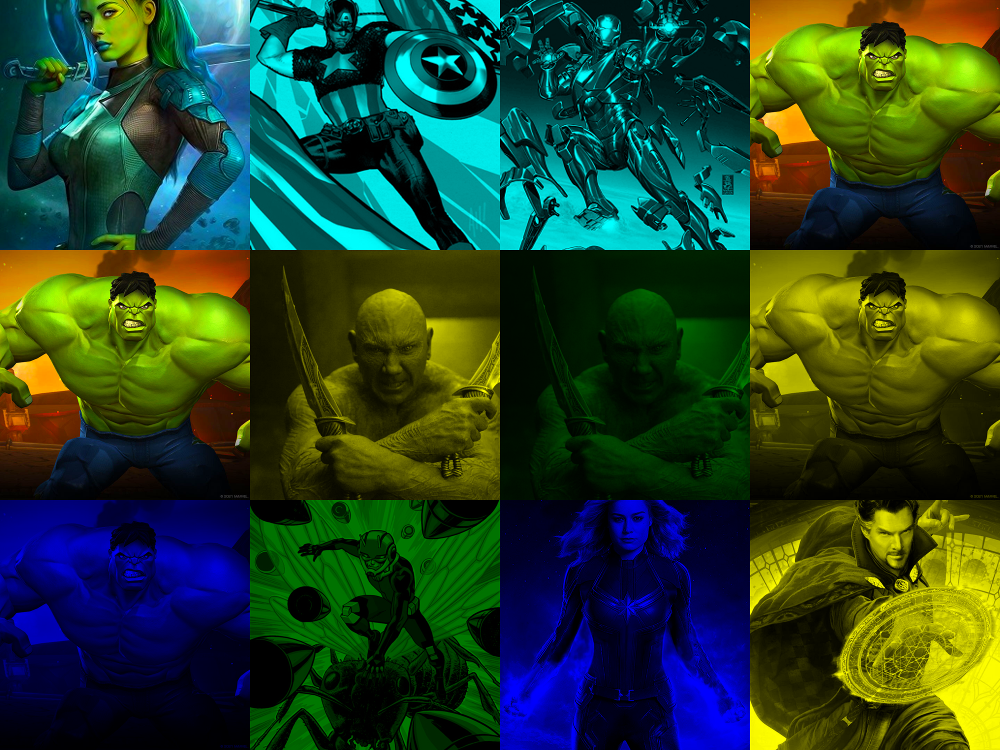

Poster saved as poster_variant_3x3.bmp


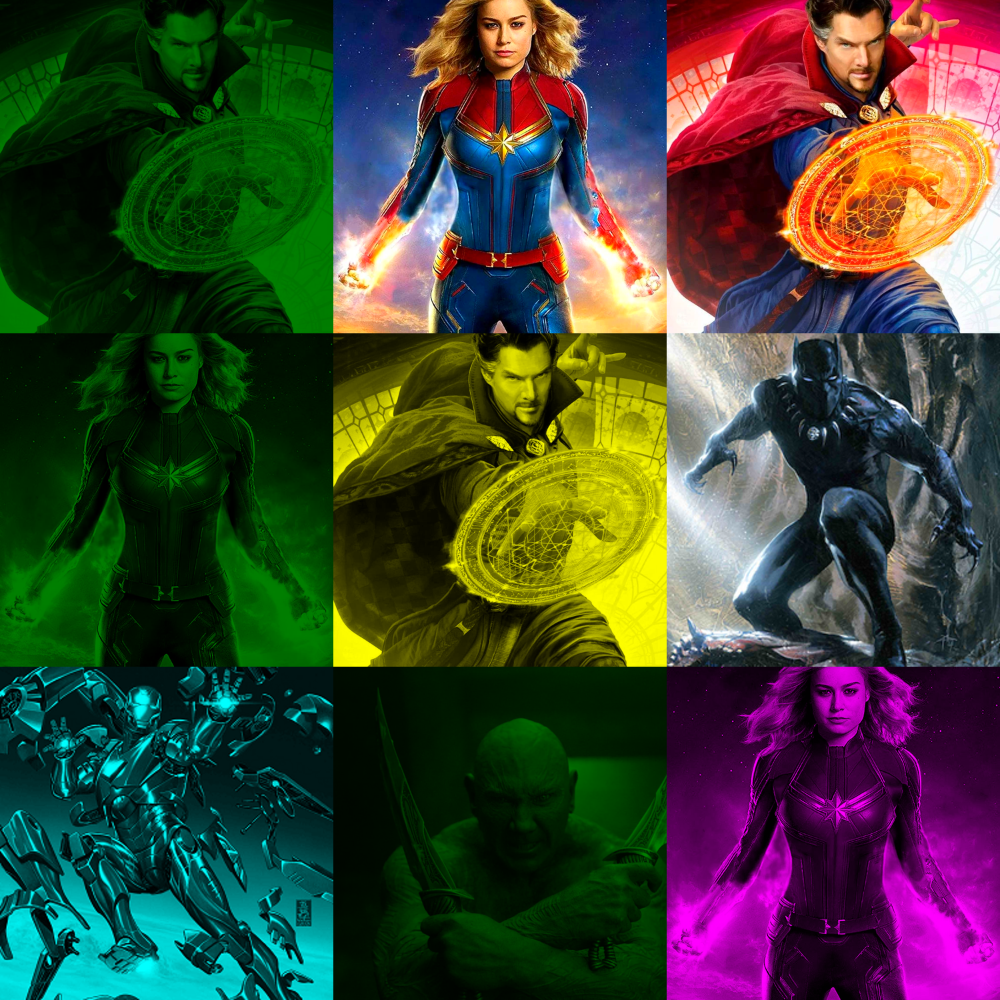

In [26]:
import os
import random
from PIL import Image, ImageEnhance, ImageOps
import glob
from IPython.display import display

# Функція для обрізки зображення до квадратного формату
def crop_to_square(img):
    width, height = img.size
    min_side = min(width, height)
    
    # Обрізаємо від центру
    left = (width - min_side) // 2
    top = (height - min_side) // 2
    right = left + min_side
    bottom = top + min_side
    return img.crop((left, top, right, bottom))

# Функція для застосування кольорового фільтра
def apply_color_filter(img):
    filters = ['red', 'green', 'blue', 'yellow', 'magenta', 'cyan']
    chosen_filter = random.choice(filters)
    
    # Застосування фільтра
    if chosen_filter == 'red':
        return ImageEnhance.Color(img).enhance(1.5).convert('RGB')
    elif chosen_filter == 'green':
        return ImageOps.colorize(ImageOps.grayscale(img), black="black", white="green")
    elif chosen_filter == 'blue':
        return ImageOps.colorize(ImageOps.grayscale(img), black="black", white="blue")
    elif chosen_filter == 'yellow':
        return ImageOps.colorize(ImageOps.grayscale(img), black="black", white="yellow")
    elif chosen_filter == 'magenta':
        return ImageOps.colorize(ImageOps.grayscale(img), black="black", white="magenta")
    elif chosen_filter == 'cyan':
        return ImageOps.colorize(ImageOps.grayscale(img), black="black", white="cyan")

# Функція для створення постера
def create_poster(folder_path, output_image_name, rows, cols):
    # Шукаємо тільки зображення у зазначеній папці
    image_files = glob.glob(os.path.join(folder_path, '*'))
    
    # Фільтруємо тільки файли із зображеннями
    image_files = [file for file in image_files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.gif'))]
    
    if not image_files:
        raise ValueError("No valid images found in the folder.")
    
    # Кількість зображень, необхідних для постера
    num_images_needed = rows * cols
    
    # Вибираємо необхідну кількість зображень із можливістю повторення
    selected_images = random.choices(image_files, k=num_images_needed)
    
    # Розміри для кожної картинки в постері
    image_size = 500
    
    # Створюємо нове зображення для постера
    poster_width = cols * image_size
    poster_height = rows * image_size
    poster = Image.new('RGB', (poster_width, poster_height))
    
    img_index = 0
    for row in range(rows):
        for col in range(cols):
            # Вибираємо зображення
            image_file = selected_images[img_index]
            img_index += 1
            
            # Відкриваємо зображення
            try:
                img = Image.open(image_file)
            except Exception as e:
                print(f"Error opening {image_file}: {e}")
                continue
            
            # Обрізаємо до квадрату та змінюємо розмір
            img = crop_to_square(img)
            img = img.resize((image_size, image_size))
            
            # Накладаємо випадковий кольоровий фільтр
            img = apply_color_filter(img)
            
            # Вставляємо картинку у відповідне місце на постері
            poster.paste(img, (col * image_size, row * image_size))
    
    # Зберігаємо постер
    poster.save(output_image_name)
    print(f"Poster saved as {output_image_name}")
    
    # Виводимо постер у Jupyter Notebook
    display(poster)

# Приклад використання функції
folder_path = './Lab4_src'  # Шлях до папки з зображеннями
create_poster(folder_path, "poster_variant_2x3.jpg", 2, 3)
create_poster(folder_path, "poster_variant_3x4.png", 3, 4)
create_poster(folder_path, "poster_variant_3x3.bmp", 3, 3)
